# Capstone: Count Vectorizing Titles & Modeling  - Video Level Pt. 4
#### Sierra St John

In [2]:
# Set up and import everything into my environment
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
import string 

# Imports for models
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import svm
from sklearn.metrics import accuracy_score

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay

from sklearn.model_selection import KFold #for K-fold cross validation
from sklearn.model_selection import cross_val_score #score evaluation
from sklearn.model_selection import cross_val_predict #prediction
from sklearn.metrics import confusion_matrix #for confusion matrix

# Ignore futurewarnings
import warnings
warnings.filterwarnings('ignore')

# NLTK Packages (Natural Language ToolKit)
import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import stopwords # lists of stopwords
from nltk.tokenize import word_tokenize # tool for splitting documents into tokens
from nltk.tokenize import sent_tokenize
from nltk.stem import PorterStemmer # basic stemmer
from nltk.stem import WordNetLemmatizer # more sophisticated word->lemma

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/sierrastjohn/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/sierrastjohn/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/sierrastjohn/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/sierrastjohn/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [3]:
# import the csv
df = pd.read_csv("~/desktop/capstone_clean_text.csv")
df.head()

,video_id,video_publishedAt,channel_id,video_title,video_description,channel_title,video_tags,video_category_id,video_duration,video_has_caption,...,average_viewCount_channel,has_shorts_tags,has_shorts_title,video_is_entertainment,log_viewCount,video_title_strings,video_description_strings,video_tags_strings,Clean_titles,Clean_Descriptions
0,S3cWeXAZs9M,2023-03-16 15:45:01+00:00,UCkG9pEb-p7DOE9nk30sS9hw,BARF DIET FOR PUPPIES,In this video we prepare Barf Diet For Puppies...,QBN Kennel,"['barf diet for puppies', 'barf diet for dogs'...",Pets & Animals,0 days 00:14:47,0,...,1978.555556,0,0,1,2.881955,"['BARF', 'DIET', 'FOR', 'PUPPIES']","['In', 'this', 'video', 'we', 'prepare', 'Barf...","['', 'barf', 'diet', 'for', 'puppies', 'barf',...","['barf', 'diet', 'puppy']","['video', 'prepare', 'barf', 'diet', 'puppy', ..."
1,Zts1icxHS8A,2023-03-16 02:23:26+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Way Back Wednesday‼️ #qbnkennel #americanbully...,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,"['Anerican bully', 'Anerican bully xl', 'Ameri...",Pets & Animals,0 days 00:00:18,0,...,1978.555556,0,1,1,3.189490,"['Way', 'Back', 'Wednesday‼️', '#qbnkennel', '...","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'anerican', 'bully', 'anerican', 'bully',...","['way', 'back', 'qbnkennel', 'americanbullyxl'...","['dog', 'pack', 'http', 'download', 'qbn', 'ap..."
2,7FWOkguytqQ,2023-03-16 00:24:41+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Facts 💯,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,['Merle american bully puppies'],Pets & Animals,0 days 00:00:07,0,...,1978.555556,0,0,1,3.216430,"['Facts', '💯']","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'merle', 'american', 'bully', 'puppies', '']",['fact'],"['dog', 'pack', 'http', 'download', 'qbn', 'ap..."
3,d9E7ekQWBlY,2023-03-15 00:15:09+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Hills Science Diet 👈👎🏼 | American Bully XL #ww...,Best Dog Food Review https://youtu.be/UY7h8aNA...,QBN Kennel,"['American bully', 'American bully xl', 'Wwrd'...",Pets & Animals,0 days 00:00:30,0,...,1978.555556,0,0,1,3.055760,"['Hills', 'Science', 'Diet', '👈👎🏼', '|', 'Amer...","['Best', 'Dog', 'Food', 'Review', 'https://you...","['', 'american', 'bully', 'american', 'bully',...","['hill', 'science', 'diet', 'american', 'bully...","['best', 'dog', 'food', 'review', 'http', 'dow..."
4,cuD4es9Pt9o,2023-03-14 19:27:30+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Ever Wondered What Your Puppy Is Thinking?,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,"['American bully', 'American bully xl', 'Qbn k...",Pets & Animals,0 days 00:00:41,0,...,1978.555556,0,0,1,3.314289,"['Ever', 'Wondered', 'What', 'Your', 'Puppy', ...","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'american', 'bully', 'american', 'bully',...","['ever', 'wondered', 'puppy', 'thinking']","['dog', 'pack', 'http', 'download', 'qbn', 'ap..."


In [49]:
# Optional: Sample the Dataframe to conserve Memory
# df = df.sample(frac=0.1, replace=False, random_state=42)

In [4]:
df.shape

(378141, 34)

## Further Process Text Columns

In [5]:
# Function to remove quotes from a list string
def remove_quotes(string):
    # Split the string into a list of items
    items = string.strip('[]').split(', ')
    # Remove quotes from each item in the list
    items = [item.strip("'") for item in items]
    # Join the items back into a string
    new_string = "[" + ", ".join(items) + "]"
    return new_string

# Apply the function to each row in the Clean_titles column
df['Clean_titles'] = df['Clean_titles'].apply(remove_quotes)

# Apply the function to each row in the Clean Descriptions column
df['Clean_Descriptions'] = df['Clean_Descriptions'].apply(remove_quotes)

# Show the updated DataFrame
df.head()

,video_id,video_publishedAt,channel_id,video_title,video_description,channel_title,video_tags,video_category_id,video_duration,video_has_caption,...,average_viewCount_channel,has_shorts_tags,has_shorts_title,video_is_entertainment,log_viewCount,video_title_strings,video_description_strings,video_tags_strings,Clean_titles,Clean_Descriptions
0,S3cWeXAZs9M,2023-03-16 15:45:01+00:00,UCkG9pEb-p7DOE9nk30sS9hw,BARF DIET FOR PUPPIES,In this video we prepare Barf Diet For Puppies...,QBN Kennel,"['barf diet for puppies', 'barf diet for dogs'...",Pets & Animals,0 days 00:14:47,0,...,1978.555556,0,0,1,2.881955,"['BARF', 'DIET', 'FOR', 'PUPPIES']","['In', 'this', 'video', 'we', 'prepare', 'Barf...","['', 'barf', 'diet', 'for', 'puppies', 'barf',...","[barf, diet, puppy]","[video, prepare, barf, diet, puppy, american, ..."
1,Zts1icxHS8A,2023-03-16 02:23:26+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Way Back Wednesday‼️ #qbnkennel #americanbully...,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,"['Anerican bully', 'Anerican bully xl', 'Ameri...",Pets & Animals,0 days 00:00:18,0,...,1978.555556,0,1,1,3.189490,"['Way', 'Back', 'Wednesday‼️', '#qbnkennel', '...","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'anerican', 'bully', 'anerican', 'bully',...","[way, back, qbnkennel, americanbullyxl, short]","[dog, pack, http, download, qbn, app, app, sto..."
2,7FWOkguytqQ,2023-03-16 00:24:41+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Facts 💯,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,['Merle american bully puppies'],Pets & Animals,0 days 00:00:07,0,...,1978.555556,0,0,1,3.216430,"['Facts', '💯']","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'merle', 'american', 'bully', 'puppies', '']",[fact],"[dog, pack, http, download, qbn, app, app, sto..."
3,d9E7ekQWBlY,2023-03-15 00:15:09+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Hills Science Diet 👈👎🏼 | American Bully XL #ww...,Best Dog Food Review https://youtu.be/UY7h8aNA...,QBN Kennel,"['American bully', 'American bully xl', 'Wwrd'...",Pets & Animals,0 days 00:00:30,0,...,1978.555556,0,0,1,3.055760,"['Hills', 'Science', 'Diet', '👈👎🏼', '|', 'Amer...","['Best', 'Dog', 'Food', 'Review', 'https://you...","['', 'american', 'bully', 'american', 'bully',...","[hill, science, diet, american, bully, xl, wwr...","[best, dog, food, review, http, download, qbn,..."
4,cuD4es9Pt9o,2023-03-14 19:27:30+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Ever Wondered What Your Puppy Is Thinking?,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,"['American bully', 'American bully xl', 'Qbn k...",Pets & Animals,0 days 00:00:41,0,...,1978.555556,0,0,1,3.314289,"['Ever', 'Wondered', 'What', 'Your', 'Puppy', ...","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'american', 'bully', 'american', 'bully',...","[ever, wondered, puppy, thinking]","[dog, pack, http, download, qbn, app, app, sto..."


In [6]:
# Function to remove quotes, commas, and square brackets from a list string
def clean_list(string):
    # Split the string into a list of items
    items = string.strip('[]').split(', ')
    # Remove quotes from each item in the list
    items = [item.strip("'") for item in items]
    # Join the items back into a string
    new_string = " ".join(items)
    return new_string

# Apply the clean_list function to each row in the Clean_titles column
df['Clean_titles'] = df['Clean_titles'].apply(clean_list)

# Apply the clean_list function to each row in the Clean Descriptions column
df['Clean_Descriptions'] = df['Clean_Descriptions'].apply(clean_list)

# Show the updated DataFrame
df.head()

,video_id,video_publishedAt,channel_id,video_title,video_description,channel_title,video_tags,video_category_id,video_duration,video_has_caption,...,average_viewCount_channel,has_shorts_tags,has_shorts_title,video_is_entertainment,log_viewCount,video_title_strings,video_description_strings,video_tags_strings,Clean_titles,Clean_Descriptions
0,S3cWeXAZs9M,2023-03-16 15:45:01+00:00,UCkG9pEb-p7DOE9nk30sS9hw,BARF DIET FOR PUPPIES,In this video we prepare Barf Diet For Puppies...,QBN Kennel,"['barf diet for puppies', 'barf diet for dogs'...",Pets & Animals,0 days 00:14:47,0,...,1978.555556,0,0,1,2.881955,"['BARF', 'DIET', 'FOR', 'PUPPIES']","['In', 'this', 'video', 'we', 'prepare', 'Barf...","['', 'barf', 'diet', 'for', 'puppies', 'barf',...",barf diet puppy,video prepare barf diet puppy american bully x...
1,Zts1icxHS8A,2023-03-16 02:23:26+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Way Back Wednesday‼️ #qbnkennel #americanbully...,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,"['Anerican bully', 'Anerican bully xl', 'Ameri...",Pets & Animals,0 days 00:00:18,0,...,1978.555556,0,1,1,3.189490,"['Way', 'Back', 'Wednesday‼️', '#qbnkennel', '...","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'anerican', 'bully', 'anerican', 'bully',...",way back qbnkennel americanbullyxl short,dog pack http download qbn app app store get s...
2,7FWOkguytqQ,2023-03-16 00:24:41+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Facts 💯,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,['Merle american bully puppies'],Pets & Animals,0 days 00:00:07,0,...,1978.555556,0,0,1,3.216430,"['Facts', '💯']","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'merle', 'american', 'bully', 'puppies', '']",fact,dog pack http download qbn app app store get s...
3,d9E7ekQWBlY,2023-03-15 00:15:09+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Hills Science Diet 👈👎🏼 | American Bully XL #ww...,Best Dog Food Review https://youtu.be/UY7h8aNA...,QBN Kennel,"['American bully', 'American bully xl', 'Wwrd'...",Pets & Animals,0 days 00:00:30,0,...,1978.555556,0,0,1,3.055760,"['Hills', 'Science', 'Diet', '👈👎🏼', '|', 'Amer...","['Best', 'Dog', 'Food', 'Review', 'https://you...","['', 'american', 'bully', 'american', 'bully',...",hill science diet american bully xl wwrd qbnke...,best dog food review http download qbn app app...
4,cuD4es9Pt9o,2023-03-14 19:27:30+00:00,UCkG9pEb-p7DOE9nk30sS9hw,Ever Wondered What Your Puppy Is Thinking?,Dog Pack https://www.youtube.com/playlist?list...,QBN Kennel,"['American bully', 'American bully xl', 'Qbn k...",Pets & Animals,0 days 00:00:41,0,...,1978.555556,0,0,1,3.314289,"['Ever', 'Wondered', 'What', 'Your', 'Puppy', ...","['Dog', 'Pack', 'https://www.youtube.com/playl...","['', 'american', 'bully', 'american', 'bully',...",ever wondered puppy thinking,dog pack http download qbn app app store get s...


In [7]:
# drop the 'video_title_strings' and 'video_description_strings' columns
df = df.drop(['video_title_strings', 'video_description_strings'], axis=1)

## Count Vectorize Titles

### Test/Train Split

In [8]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

#Split the dataset into training and testing sets
X = df.drop(['video_id', 'video_publishedAt','channel_id','video_title','video_description',
             'channel_title','video_tags','video_category_id','video_duration','video_sub_category',
             'video_tags_strings','Clean_Descriptions','video_viewCount','statistics_likeCount',
             'statistics_commentCount','average_viewCount_channel','log_viewCount'], axis=1) 
y = df['log_viewCount'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Count Vectorize

In [9]:
from sklearn.feature_extraction.text import CountVectorizer

# Create CountVectorizer objects
cv_title = CountVectorizer(min_df=100,max_features=500, stop_words='english')

# Fit Train
title_fit = cv_title.fit(X_train['Clean_titles'])

# Transform Train
title_transform = title_fit.transform(X_train['Clean_titles'])

# Transform Test
title_test = title_fit.transform(X_test['Clean_titles'])

### Confirm Test and Train are the same Shape

In [10]:
title_transform.shape

(302512, 500)

In [11]:
title_test.shape

(75629, 500)

### Return Training Set back to the DataFrame

In [12]:
title_counts_train = pd.DataFrame(
    title_transform.todense(), # transform to dense
    columns=[col for col in title_fit.get_feature_names()], # for each column, retrieve the feature names
    index=X_train.index # keep original train index to ensure matching with the numeric data
)

In [14]:
# Concatenate X_train with the training set count vectorized
X_train = pd.concat([X_train, title_counts_train], axis=1)

In [15]:
# Hold On to Training Set Titles
X_train_titles = X_train['Clean_titles']
# Drop the Clean Titles Column now that its been vectorized
X_train = X_train.drop(['Clean_titles'],axis=1)

### Return Test Set back to the DataFrame

In [16]:
# Return Test to DF
title_counts_test = pd.DataFrame(
    title_test.todense(), # transform to dense
    columns=[col for col in title_fit.get_feature_names()], # for each column, retrieve the feature names
    index=X_test.index # keep original train index to ensure matching with the numeric data
)

In [17]:
# Concatenate X_test with the test set count vectorized
X_test = pd.concat([X_test, title_counts_test], axis=1)

In [18]:
# Hold On to Test Set Titles
X_test_titles = X_test['Clean_titles']
# Drop the Clean Titles Column now that its been vectorized
X_test = X_test.drop(['Clean_titles'],axis=1)

## Run Models On Only Text Features

### Linear Regression

In [30]:
# Initialize the linear regression model and fit the training data
lr_model = LinearRegression()
lr_model.fit(title_counts_train, y_train)

# Evaluate the performance of the model
print('Train Performance:',lr_model.score(title_counts_train,y_train))
print('Test Performance:',lr_model.score(title_counts_test,y_test))

Train Performance: 0.05726183337426294
Test Performance: 0.05730256051847926


### Decision Tree

In [32]:
from sklearn.tree import DecisionTreeRegressor

# Initialize the decision tree model
dt_model = DecisionTreeRegressor(max_depth = 3)

# Fit the training data to the decision tree model
dt_model.fit(title_counts_train, y_train)

# Evaluate the performance of the model
from sklearn.metrics import r2_score
print('Train Performance:', dt_model.score(title_counts_train,y_train))
print('Test Performance:', dt_model.score(title_counts_test,y_test))

Train Performance: 0.013511740984038734
Test Performance: 0.012757968680709775


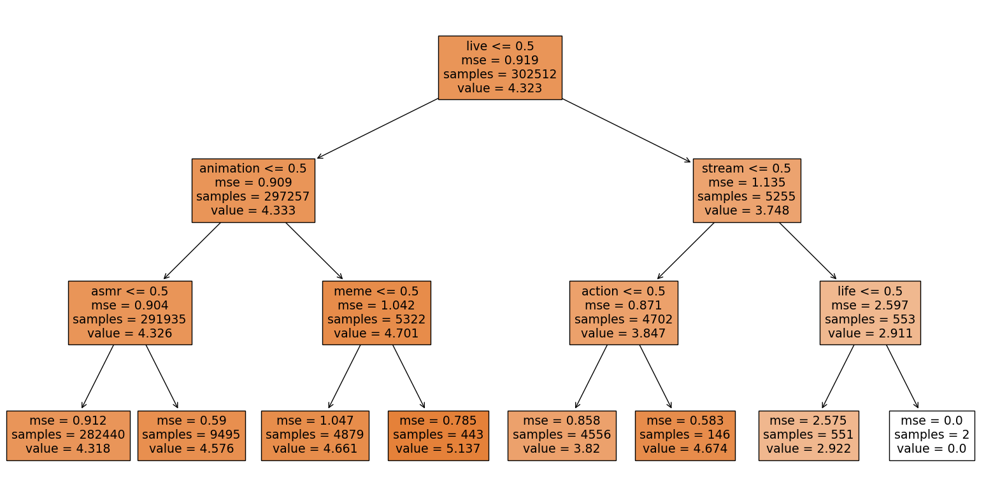

In [40]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
plot_tree(dt_model, filled=True, feature_names=title_counts_train.columns)
plt.show()

### Random Forest

In [41]:
from sklearn.ensemble import RandomForestRegressor

# Initialize the Random Forest model
rf_model = RandomForestRegressor(max_depth=30)

# Fit the training data to the Random Forest model
rf_model.fit(title_counts_train, y_train)

# Evaluate the performance of the model
from sklearn.metrics import r2_score
print('Train Performance:', rf_model.score(title_counts_train, y_train))
print('Test Performance:', rf_model.score(title_counts_test,y_test))

Train Performance: 0.09206193060845025
Test Performance: 0.06781827968992749


# PCA On Text Features

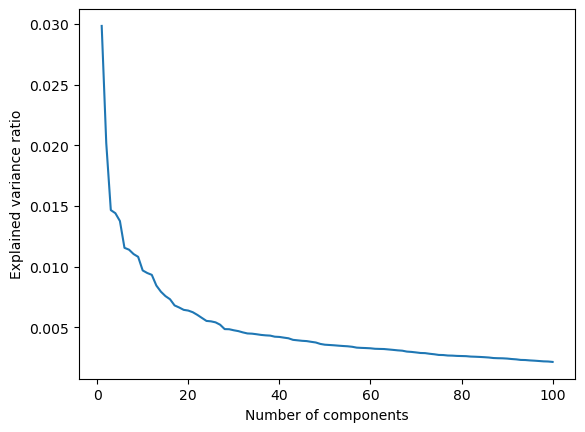

In [45]:
# Initialize PCA with 100 as n_components
n_components = 100
pca = PCA(n_components=n_components)

# Fit PCA on the text training data
X_train_text_pca = pca.fit_transform(title_counts_train)

# Plot the explained variance ratio for each component
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.show()

In [62]:
# Apply PCA to reduce the dimensionality of the text data
pca = PCA(n_components=30)
X_train_pca = pca.fit_transform(title_counts_train)
X_test_pca = pca.transform(title_counts_test)

In [63]:
## W/30 n_components
from sklearn.ensemble import RandomForestRegressor

# Initialize the Random Forest model
rf_model = RandomForestRegressor(max_depth=30)

# Fit the training data to the Random Forest model
rf_model.fit(X_train_pca, y_train)

# Evaluate the performance of the model
from sklearn.metrics import r2_score
print('Train Performance:', rf_model.score(X_train_pca, y_train))
print('Test Performance:', rf_model.score(X_test_pca,y_test))

Train Performance: 0.40849678414830803
Test Performance: 0.1251856356628227


## Linear Regression - Numeric Columns & Raw Text (No PCA)

In [114]:
# Initialize the linear regression model and fit the training data
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Evaluate the performance of the model
print('Train Performance:',lr_model.score(X_train,y_train))
print('Test Performance:',lr_model.score(X_test,y_test))

Train Performance: 0.10104036540830386
Test Performance: 0.1040771679462541


In [65]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Make predictions on train data
y_pred = lr_model.predict(X_train)

# Make predictions on test data
y_pred_test = lr_model.predict(X_test)

# Print evaluation metrics (train)
print("Training - Mean Absolute Error:", mean_absolute_error(y_train, y_pred))
print("Training - Mean Squared Error:", mean_squared_error(y_train, y_pred))
print("Training - Root Mean Squared Error:", np.sqrt(mean_squared_error(y_train, y_pred)))
print("Training - R2 Score:", r2_score(y_train, y_pred))
print('----------')
# Print evaluation metrics (test)
print("Test - Mean Absolute Error:", mean_absolute_error(y_test, y_pred_test))
print("Test - Mean Squared Error:", mean_squared_error(y_test, y_pred_test))
print("Test - Root Mean Squared Error:", np.sqrt(mean_squared_error(y_test, y_pred_test)))
print("Test - R2 Score:", r2_score(y_test, y_pred_test))

Training - Mean Absolute Error: 0.7133797980181338
Training - Mean Squared Error: 0.8258401623714599
Training - Root Mean Squared Error: 0.9087574827045222
Training - R2 Score: 0.10104036540830386
----------
Test - Mean Absolute Error: 0.7105779211817101
Test - Mean Squared Error: 0.817270283769583
Test - Root Mean Squared Error: 0.9040300237102654
Test - R2 Score: 0.1040771679462541


## Decision Tree - Numeric Columns & Raw Text (No PCA)

In [66]:
from sklearn.tree import DecisionTreeRegressor

# Initialize the decision tree model
dt_model = DecisionTreeRegressor(max_depth = 3)

# Fit the training data to the decision tree model
dt_model.fit(X_train, y_train)

# Evaluate the performance of the model
from sklearn.metrics import r2_score
print('Train Performance:', dt_model.score(X_train,y_train))
print('Test Performance:', dt_model.score(X_test,y_test))

Train Performance: 0.0678084253138681
Test Performance: 0.06773005730689252


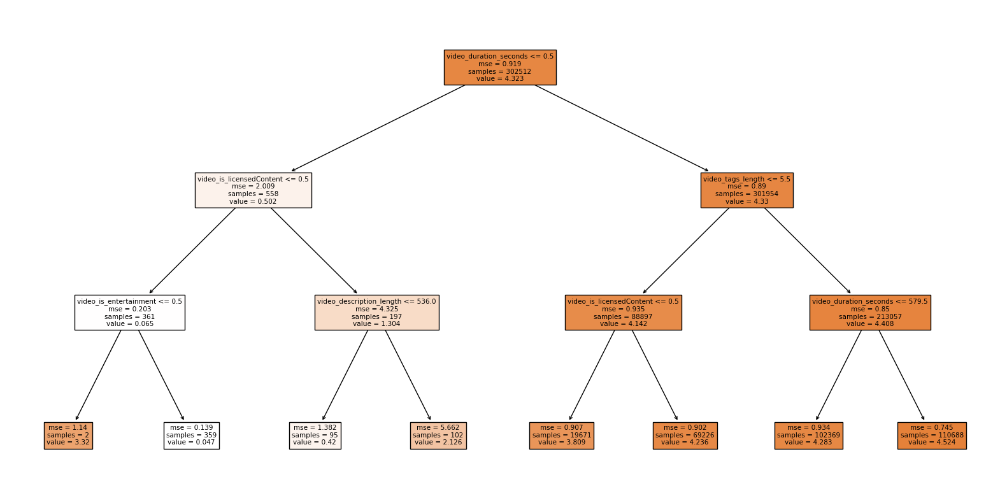

In [67]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
plot_tree(dt_model, filled=True, feature_names=X_train.columns)
plt.show()

## Random Forest - Numeric Columns & Raw Text (No PCA)

In [69]:
from sklearn.ensemble import RandomForestRegressor

# Initialize the Random Forest model
rf_model = RandomForestRegressor(max_depth=30)

# Fit the training data to the Random Forest model
rf_model.fit(X_train, y_train)

# Evaluate the performance of the model
from sklearn.metrics import r2_score
print('Train Performance:', rf_model.score(X_train,y_train))
print('Test Performance:', rf_model.score(X_test,y_test))

Train Performance: 0.5844206036953872
Test Performance: 0.3508595011190967


In [72]:
# Combine feature importances with feature names into tuples
fn = zip(rf_model.feature_importances_, X_train.keys())
# Sort the tuples by feature importances
fn = sorted(fn, key=lambda x: x[0])
# Print the sorted list of feature names and their importances
for num, name in fn:
    print(name, num)

coin 8.214959366258863e-05
whisper 8.669079883548544e-05
soft 9.473190791038455e-05
group 0.00010472475795296819
daily 0.00011011761931318116
bag 0.00012050984812598259
trigger 0.0001210443105166303
ride 0.00012765558712491583
playtime 0.0001344150372562769
shopping 0.00013715283396101928
moving 0.00014659192036495822
personal 0.00014677836075871858
effect 0.00016161119711336175
spicy 0.0001617811092593915
mask 0.00016246610214350362
reacting 0.00016405593505745077
doctor 0.00016412384233407482
experience 0.00017000640465886455
double 0.0001745488591124217
problem 0.00017662748720530797
away 0.0001774538538742904
dj 0.00017921588684654435
cook 0.00018047040932765737
person 0.00018395090277498273
pregnant 0.0001842158168452145
gone 0.00018854327587907184
ear 0.0001888004279242934
react 0.00018903963989078863
metal 0.00019055914448513298
opening 0.00019070051175969427
nyc 0.00019350973092549422
step 0.00019359547290626614
dollar 0.00019391490576332773
poor 0.00019433088231545184
store 0.

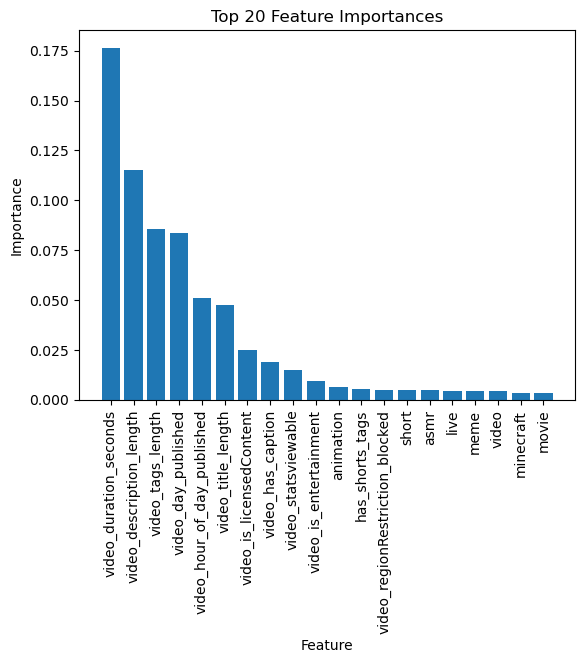

In [71]:
# Combine feature importances with feature names into tuples
fn = zip(rf_model.feature_importances_, X_train.keys())

# Sort the tuples by feature importances in descending order
fn = sorted(fn, key=lambda x: x[0], reverse=True)

# Get the top 20 features by importance
top_20_fn = fn[:20]

# Get feature importances and names for the top 20 features
imps = [f[0] for f in top_20_fn]
names = [f[1] for f in top_20_fn]

# Plot feature importances as a bar chart
plt.bar(names, imps)

# Set axis labels and title
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Top 20 Feature Importances")

# Rotate x-axis tick labels if they overlap
plt.xticks(rotation=90)

# Display the plot
plt.show()

## Combine Text Columns with PCA to Numeric Columns

### Confirm Sizes of Train and Test

In [97]:
print(X_train_pca.shape)
print(X_test_pca.shape)

(302512, 30)
(75629, 30)


In [96]:
print(X_train1.shape)
print(X_test1.shape)

(302512, 14)
(75629, 14)


### Combine Dataframes

In [78]:
#Split the dataset into training and testing sets to prep for adding PCA Columns
X1 = df.drop(['video_id', 'video_publishedAt','channel_id','video_title','video_description',
             'channel_title','video_tags','video_category_id','video_duration','video_sub_category',
             'video_tags_strings','Clean_Descriptions','video_viewCount','statistics_likeCount',
             'statistics_commentCount','average_viewCount_channel','log_viewCount','Clean_titles'], axis=1) 
y1 = df['log_viewCount'] 

X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.2, random_state=42)

In [95]:
# Concatenate the two dataframes
X_train_combined = np.concatenate((X_train1, X_train_pca), axis=1)

# Concatenate the two dataframes
X_test_combined = np.concatenate([X_test1, X_test_pca], axis=1)

# Display the combined dataframes sizes
print(X_train_combined.shape)
print(X_test_combined.shape)

(302512, 44)
(75629, 44)


## Random Forest - Numeric Columns & PCA Text Columns

In [98]:
from sklearn.ensemble import RandomForestRegressor

# Initialize the Random Forest model
rf_model = RandomForestRegressor(max_depth=30)

# Fit the training data to the Random Forest model
rf_model.fit(X_train_combined, y_train)

# Evaluate the performance of the model
from sklearn.metrics import r2_score
print('Train Performance:', rf_model.score(X_train_combined,y_train))
print('Test Performance:', rf_model.score(X_test_combined,y_test))

Train Performance: 0.8393707904307877
Test Performance: 0.35066600054267916


Looks like the highest performance I was able to achieve is 35% on the test set with both PCA on the text columns with numeric features as well as the raw text columns combined with the numeric features.

## LDA Model on Titles

In [99]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

# create a variable for the documents in the dataframe
documents = X_train_titles

# create a CountVectorizer object to transform the text data into a matrix of word counts
vectorizer = CountVectorizer(min_df=100,max_features=500, stop_words='english')

# fit and transform the vectorizer on the text data
X1 = vectorizer.fit_transform(documents)
X1_test = vectorizer.transform(X_test_titles)

# create an LDA model with 3 clusters
lda = LatentDirichletAllocation(n_components=3)

# fit the model on the transformed text data
lda.fit(X1)

# predict the topic for each document (1-hot vector)
topic_labels_oh = lda.transform(X1)
topic_labels_test_oh = lda.transform(X1_test)
# convert 1-hot topic labels to integer
topic_labels = topic_labels_oh.argmax(axis=1)

In [103]:
import plotly.io as pio
# get the top words for each topic
topic_words = vectorizer.get_feature_names()  # Get the list of all words in the corpus
num_top_words = 10  # Define the number of top words to extract for each topic
topic_words_df = pd.DataFrame()  # Create an empty DataFrame to store the top words and their importances for each topic

for i, topic in enumerate(lda.components_):  # Loop over each topic and its associated word importances
    top_words_idx = topic.argsort()[:-num_top_words-1:-1]  # Get the indices of the top words for the current topic
    top_words = [topic_words[i] for i in top_words_idx]  # Get the actual words from the indices
    topic_importances = topic[top_words_idx]  # Get the word importances for the top words
    topic_word_df = pd.DataFrame({'Topic': i, 
                                  'Top Words': top_words, 
                                  'Word Importance': topic_importances})  # Create a DataFrame with the top words and their importances for the current topic
    topic_words_df = pd.concat([topic_words_df, topic_word_df], axis=0)  # Append the current topic's top words and importances to the main DataFrame

# create a scatter plot of the top words for each topic
fig = px.scatter(topic_words_df,
                 x='Word Importance',
                 y='Top Words',
                 size='Word Importance',
                 size_max=50,
                 color='Topic',
                 color_discrete_sequence=px.colors.qualitative.Set1,
                 labels={
                     'x': 'Word Importance',
                     'y': 'Top Words',
                     'color': 'Topics'
                 },
                 hover_data={
                     'Word Importance': ':.3f',
                     'Top Words': False
                 },
                 title='YouTube Video Topics and Top Words'
                )
fig.show()  # Show the resulting scatter plot

# # Optional: export the scatter plot as a PNG file
# pio.write_image(fig, 'LDA_scatter_plot.png')

## Trying a Linear Regression with Topics

In [112]:
# Linear Regression with Topic Features
X_train_topic = X_train.copy()
X_train_topic['t0'] = topic_labels_oh[:, 0]
X_train_topic['t1'] = topic_labels_oh[:, 1]
X_train_topic['t2'] = topic_labels_oh[:, 2]
X_test_topic = X_test.copy()
X_test_topic['t0'] = topic_labels_test_oh[:, 0]
X_test_topic['t1'] = topic_labels_test_oh[:, 1]
X_test_topic['t2'] = topic_labels_test_oh[:, 2]

# Initialize the linear regression model and fit the training data
lr_model1 = LinearRegression()
lr_model1.fit(X_train_topic, y_train)

# Predict the video_viewCount
y_pred = lr_model1.predict(X_train_topic)
y_pred_test = lr_model1.predict(X_test_topic)

# Evaluate the performance of the model
print('Train Performance:', lr_model1.score(X_train_topic,y_train))
print('Test Performance:', lr_model1.score(X_test_topic,y_test))

Train Performance: 0.1012166434445827
Test Performance: 0.10427254959259435


## Find Highest and Lowest Performing Words in Video Titles

In [140]:
# Get the coefficients for all features
all_coefs = lr_model.coef_

# Get the column names from X_train
cols = X_train.columns

# Filter out columns that contain continuous or other values
word_cols = [col for col in cols if '_' not in col]

# Get the indices of the word columns
word_indices = [i for i, col in enumerate(cols) if col in word_cols]

# Get the coefficients for the word columns only
word_coefs = all_coefs[word_indices]

# Create a new dataframe with only the filtered columns and their corresponding coefficients
coefs = pd.DataFrame({'regression coefficients': word_coefs}, index=word_cols)

# Sort the coefficients by descending order
coefs_sorted = coefs.sort_values('regression coefficients', ascending=False)

# Print the top 10 words with the largest coefficients
coefs_sorted.head(20)

,regression coefficients
tried,0.493789
dub,0.326863
worst,0.326686
magnet,0.314530
bought,0.308824
cut,0.307256
animation,0.301967
shocking,0.297606
sister,0.287010
version,0.284136


In [141]:
# Print the top 10 words with the smallest coefficients
coefs_sorted.tail(20)

,regression coefficients
tarot,-0.238299
reason,-0.250543
draw,-0.266889
free,-0.278622
chat,-0.280943
today,-0.285122
march,-0.292138
beautiful,-0.296655
country,-0.306460
market,-0.314762


In [142]:
import plotly.graph_objs as go

# Sort the coefficients in descending order and get the top 20 words
top_coefs = coefs.sort_values(by='regression coefficients', ascending=False).head(20)

# Create the trace for the bar chart
trace = go.Bar(
    x=top_coefs['regression coefficients'],
    y=top_coefs.index,
    orientation='h'
)

# Create the layout for the chart
layout = go.Layout(
    title='Top 20 Words with Highest Coefficients',
    yaxis=dict(
        automargin=True
    )
)

# Create the figure and plot the chart
fig = go.Figure(data=[trace], layout=layout)
fig.show()

In [143]:
import plotly.graph_objs as go

# Sort the coefficients in ascending order and get the top 20 words
bottom_coefs = coefs.sort_values(by='regression coefficients', ascending=True).head(20)

# Create the trace for the bar chart
trace = go.Bar(
    x=bottom_coefs['regression coefficients'],
    y=bottom_coefs.index,
    orientation='h'
)

# Create the layout for the chart
layout = go.Layout(
    title='Top 20 Words with Lowest Coefficients',
    yaxis=dict(
        automargin=True
    )
)

# Create the figure and plot the chart
fig = go.Figure(data=[trace], layout=layout)
fig.show()

In [144]:
# Get the top 10 and bottom 10 performing words
top_words = coefs.sort_values('regression coefficients', ascending=False)[:10]
bottom_words = coefs.sort_values('regression coefficients', ascending=True)[:10]

# Plot the top 10 and bottom 10 performing words
fig = go.Figure()
fig.add_trace(go.Bar(x=top_words.index, y=top_words['regression coefficients'], name='Top 10 Words'))
fig.add_trace(go.Bar(x=bottom_words.index, y=bottom_words['regression coefficients'], name='Bottom 10 Words'))
fig.update_layout(title='Top and Bottom Performing Words', xaxis_title='Words', yaxis_title='Regression Coefficients')
fig.show()

By changing your video title to one of the top performing words, on average you can expect to increase your views by 0.32.


## Word Frequency

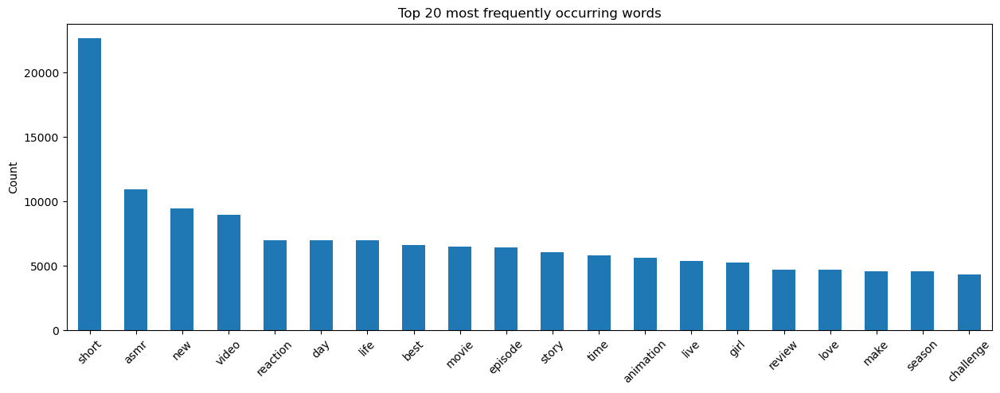

In [145]:
word_counts = pd.DataFrame(
    {"counts": title_transform.toarray().sum(axis=0)},
    index=cv_title.get_feature_names()
).sort_values("counts", ascending=False)

word_counts.head(20).plot(kind="bar", figsize=(15, 5), legend=False)
plt.title("Top 20 most frequently occurring words")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

## Showing OneTake Channel within the Histogram

In [200]:
# create a new DataFrame with the total log views per channel
df_channel_views = df.groupby('channel_id')['log_viewCount'].sum().reset_index()

# create a new column 'OneTake_Y_N' based on the channel_id
df_channel_views['OneTake?'] = df_channel_views['channel_id'].apply(lambda x: 'OneTake' if x=='UCZgE8_DGeiw89xnvt_7BzyQ' else 'Other Channel')
df_channel_views

,channel_id,log_viewCount,OneTake?
0,UC-2Uy2tjvaeJtkh3TCMCVFA,398.957237,Other Channel
1,UC-2eTwxABy5K_QhUYvya3Rg,42.789222,Other Channel
2,UC-4zDbwRwcpxzQ0xN27aSmQ,22.619489,Other Channel
3,UC-9f0dAsu9i7EV9JCKU6O6Q,449.867671,Other Channel
4,UC-IUO31UtYdHUbXspktqypQ,460.653480,Other Channel
...,...,...,...
4558,UCzuGtMl2IlPB5ljgwkLJ3cQ,303.321786,Other Channel
4559,UCzuYRqI9lSLy5fDwVoy0bKg,280.222921,Other Channel
4560,UCzuwNLVtwai-DkcrIDMMr0Q,475.901480,Other Channel
4561,UCzxG2q7N8jgMXaxjE6iVTDA,394.116658,Other Channel


In [209]:
# create a new DataFrame with the total log views per channel
df_channel_views = df.groupby('channel_id')['log_viewCount'].sum().reset_index()

# create a new column 'OneTake_Y_N' based on the channel_id and log_viewCount range
df_channel_views['OneTake?'] = df_channel_views.apply(lambda x: 'OneTake' if x['channel_id']=='UCZgE8_DGeiw89xnvt_7BzyQ' or (x['log_viewCount'] >= 430 and x['log_viewCount'] <= 440) else 'Other Channel', axis=1)


In [217]:
import plotly.express as px

# create a histogram for 'log_viewCount'
fig = px.histogram(title='View Count Log Scaled by Channel',data_frame=df_channel_views,
                   x='log_viewCount', nbins=100,
                   color='OneTake?',color_discrete_map={'OneTake': 'red', 'Other Channel': 'gray'})
# update the x and y axis labels
fig.update_layout(xaxis_title=None, yaxis_title=None)

# show the figure
fig.show()

In [219]:
# create a histogram for 'log_viewCount'
fig = px.histogram(title='View Count Log Scaled',data_frame=df,
                   x='log_viewCount', nbins=200)
# show the figure
fig.show()